# Import dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('/Users/tyco/Desktop/MADS/madsvenv/workshop-collaboration/data/raw/correlation_jngdc.csv')
df.head(5)

,Unnamed: 0,target,0,1,2,3,4,5,6,7,...,90,91,92,93,94,95,96,97,98,99
0,0,-33.649387,0.485653,0.901637,-1.212651,0.139052,0.709391,-0.994617,0.282911,-2.175066,...,-0.287330,0.834672,-0.692276,0.627274,1.149234,0.464482,1.593337,0.274752,2.152221,-0.205768
1,1,120.201493,-0.893088,-0.071643,0.009755,1.347144,0.379104,0.093540,0.585669,-1.109070,...,1.024032,1.248742,0.383929,0.456798,0.708521,-1.075047,0.428324,-0.803252,-0.114866,0.351547
2,2,-141.708704,0.456587,-0.472096,1.606499,1.367399,-0.073593,0.981937,-0.002895,0.250887,...,-0.540053,-1.386105,-1.124981,-0.012272,-2.196037,-0.213129,1.151220,0.885248,1.226929,-0.716621
3,3,-184.095636,-0.765121,-0.938719,-0.854190,0.131660,-0.414848,-0.008027,-0.988914,-1.434419,...,-1.893789,0.059948,-0.887020,-0.700581,-0.671862,1.461510,2.365019,-1.583156,-1.046293,-0.958653
4,4,246.179468,-0.382082,0.026456,2.268877,0.527533,-0.053195,1.566953,-1.114428,-0.545163,...,-0.984395,0.361132,2.491734,-1.471508,-1.187280,-1.700168,0.466667,-0.309938,0.253091,0.833892


In [14]:
# Basic info
print(df.info())

# Summary statistics
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Columns: 102 entries, Unnamed: 0 to 99
dtypes: float64(101), int64(1)
memory usage: 398.6 KB
None
       Unnamed: 0      target           0           1           2           3  \
count  500.000000  500.000000  500.000000  500.000000  500.000000  500.000000   
mean   249.500000   -0.882341    0.040909   -0.044409    0.015326   -0.002659   
std    144.481833  160.922949    0.995599    1.038941    1.027452    1.002333   
min      0.000000 -485.914105   -3.295622   -3.404040   -3.055395   -3.006454   
25%    124.750000 -108.942259   -0.619451   -0.747889   -0.744192   -0.655444   
50%    249.500000   -9.114029    0.024301    0.019376    0.022804   -0.018949   
75%    374.250000  117.389754    0.723823    0.594201    0.724441    0.637174   
max    499.000000  456.485770    2.969883    3.736603    2.595107    2.849739   

                4           5           6           7  ...          90  \
count  500.000000  500.000

In [18]:
# Check for missing values
df.isnull().sum().sort_values(ascending=False)

Unnamed: 0    0
62            0
72            0
71            0
70            0
             ..
29            0
28            0
27            0
26            0
99            0
Length: 102, dtype: int64

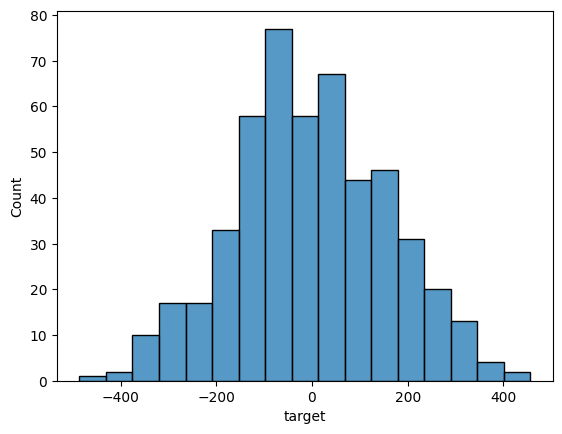

In [20]:
# Distribution of the target column
sns.histplot(df['target'])
plt.show()

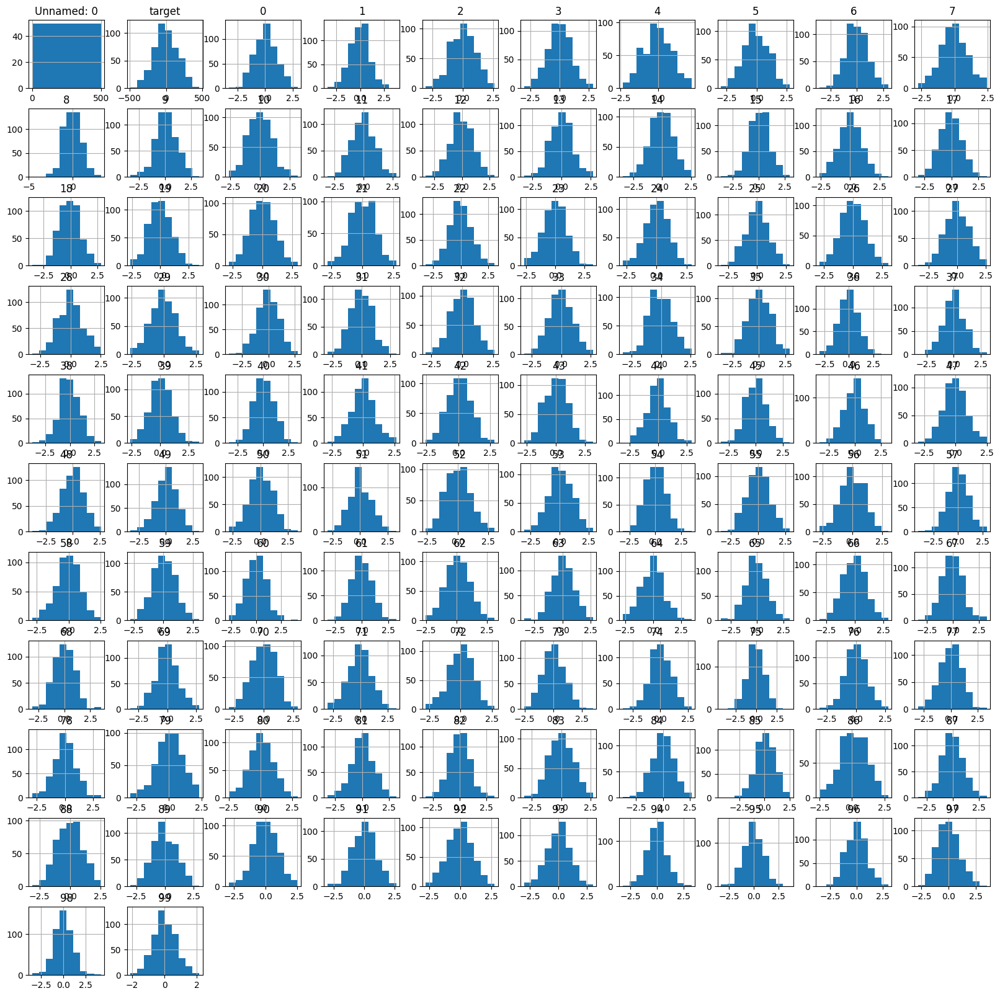

In [21]:
df.hist(figsize=(20,20))
plt.show()

In [21]:
correlation = df.corr()['target'].sort_values(ascending=False)
correlation

target    1.000000
99        0.776946
92        0.583112
51        0.490532
58        0.334788
            ...   
83       -0.070075
43       -0.071006
81       -0.084163
18       -0.099987
86       -0.113929
Name: target, Length: 102, dtype: float64

In [23]:
from sklearn.ensemble import RandomForestRegressor

X = df.drop('target', axis=1)
y = df['target']

model = RandomForestRegressor()
model.fit(X, y)

# Feature importance
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'feature': X.columns, 'importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

print(feature_importance_df)

    feature  importance
100      99    0.630092
42       41    0.092025
59       58    0.066434
25       24    0.027225
47       46    0.022022
..      ...         ...
24       23    0.000885
7         6    0.000870
12       11    0.000755
66       65    0.000718
82       81    0.000635

[101 rows x 2 columns]


<Axes: xlabel='99', ylabel='target'>

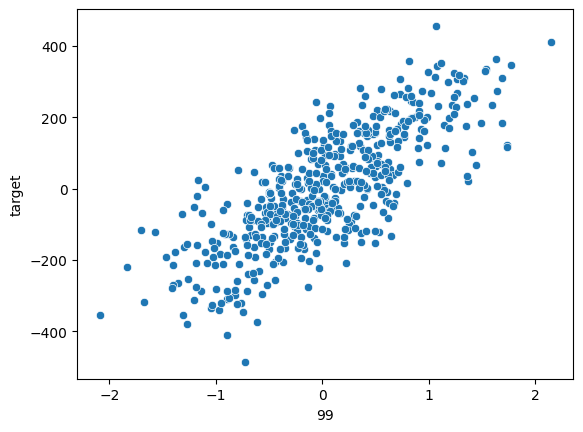

In [3]:
sns.scatterplot(x=df['99'], y=df['target'])

First 10 columns

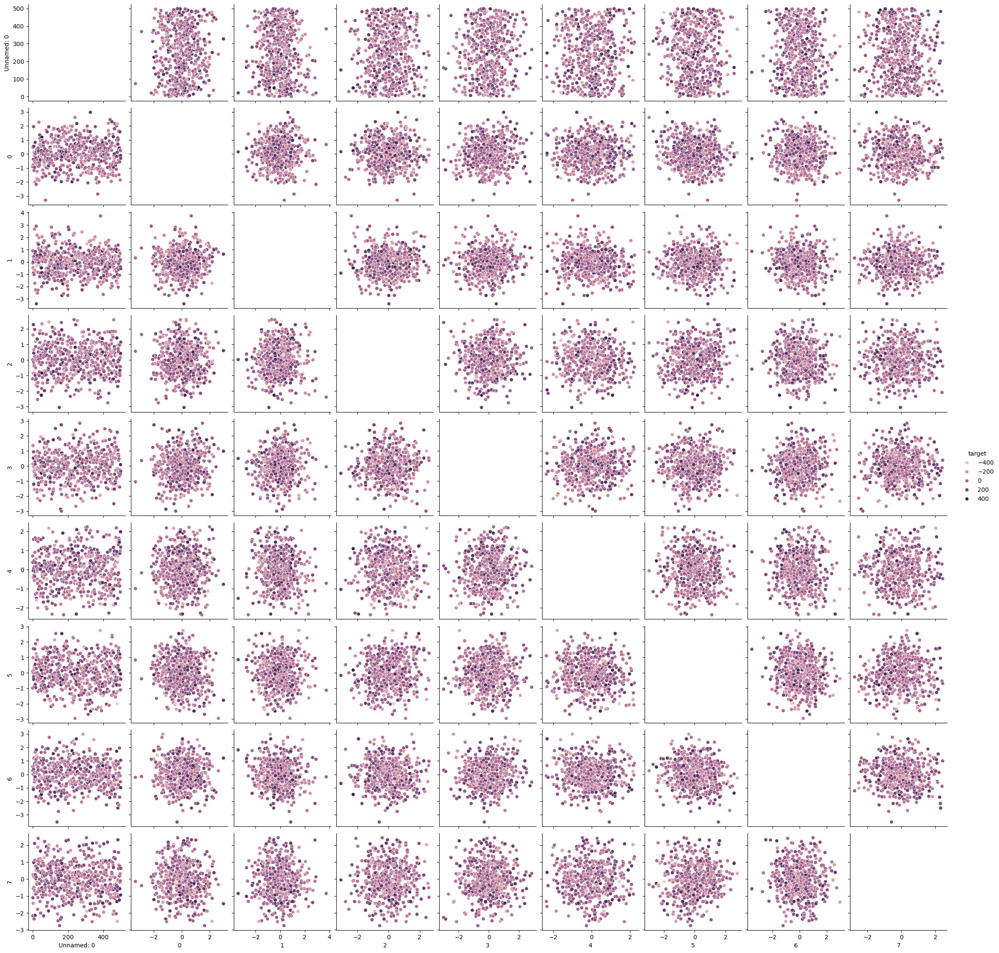

In [17]:
# Select the columns you want to include in the scatter matrix
columns_to_include = df.columns[:10] 
# .tolist() + ['target'] 
df_subset = df[columns_to_include]

# print(df_subset['target'].shape)
# Create the scatter matrix
sns.pairplot(df_subset, hue='target')
plt.show()

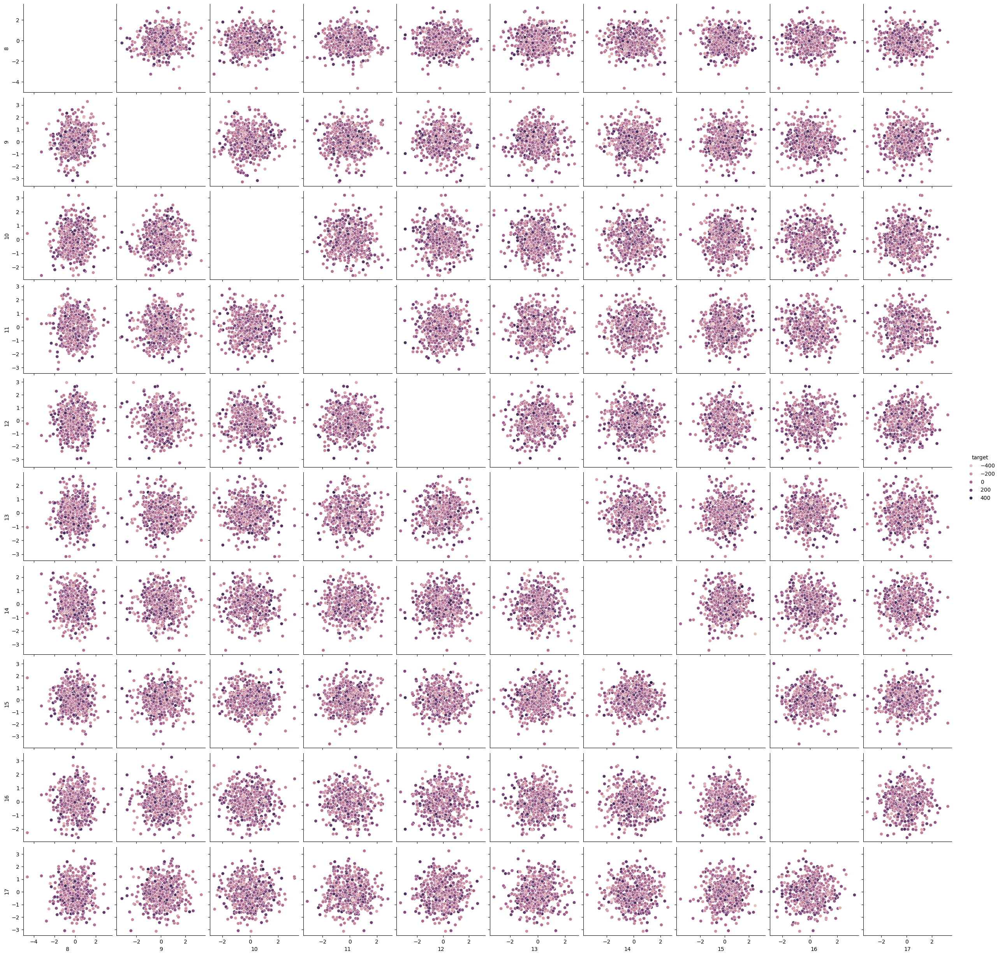

In [18]:
# Select the columns you want to include in the scatter matrix
columns_to_include = df.columns[10:20].tolist() + ['target'] 
df_subset = df[columns_to_include]

# print(df_subset['target'].shape)
# Create the scatter matrix
sns.pairplot(df_subset, hue='target')
plt.show()

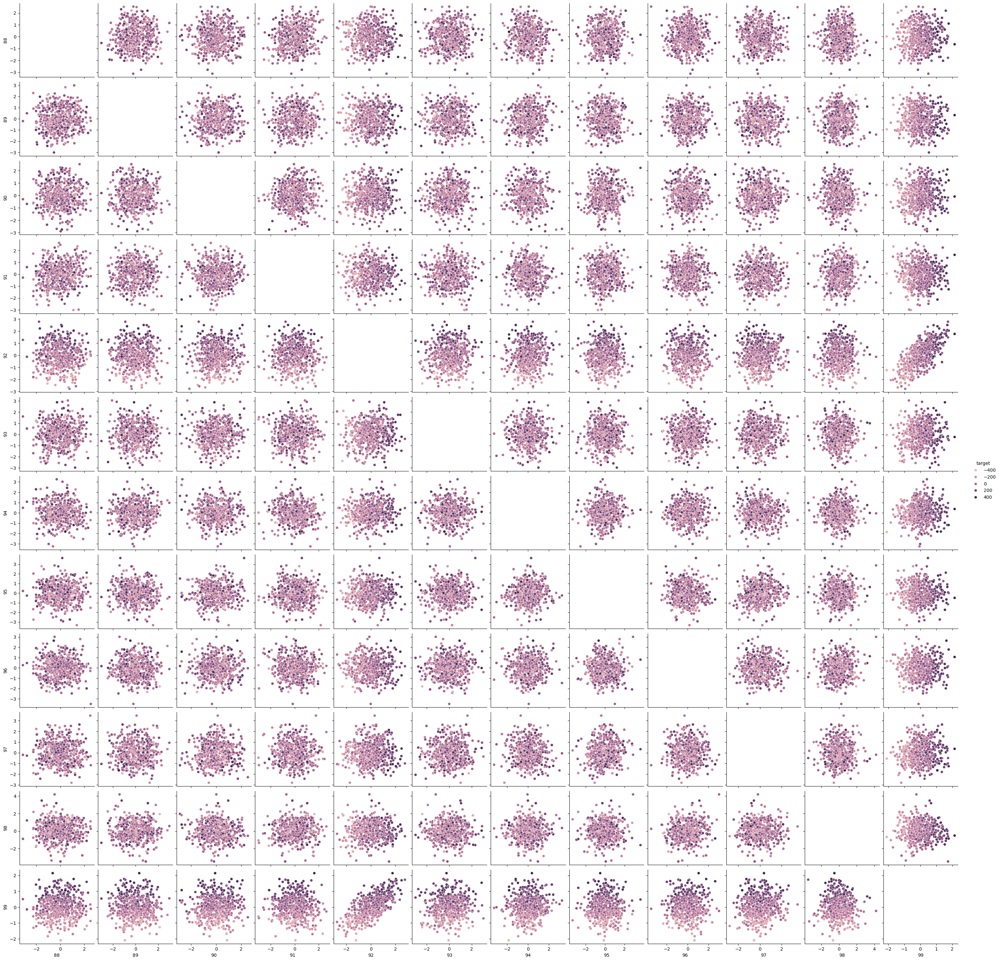

In [20]:
# Select the columns you want to include in the scatter matrix
columns_to_include = df.columns[90:102].tolist() + ['target'] 
df_subset = df[columns_to_include]

# print(df_subset['target'].shape)
# Create the scatter matrix
sns.pairplot(df_subset, hue='target')
plt.show()